---
## Section 1: Setup & Installation

In [1]:
# ==================== MOUNT GOOGLE DRIVE ====================
from google.colab import drive
drive.mount('/content/drive')
print("Google Drive berhasil di-mount.")

Mounted at /content/drive
Google Drive berhasil di-mount.


In [2]:
import os
import io
import json
import math
import datetime
import shutil
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from pathlib import Path
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix as sk_confusion_matrix

# Reproducibility
SEED = 42
tf.keras.utils.set_random_seed(SEED)
np.random.seed(SEED)

# Optional: make GPU memory allocation safer in Colab
for gpu in tf.config.list_physical_devices('GPU'):
    try:
        tf.config.experimental.set_memory_growth(gpu, True)
    except Exception:
        pass

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU available: {tf.config.list_physical_devices('GPU')}")

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
# ==================== KONFIGURASI ====================

# Folder utama dataset di Google Drive.
DRIVE_BASE_DIR = "/content/drive/MyDrive/dataset_after_balancing"

ORIGINAL_DATASET_DIR = os.path.join(DRIVE_BASE_DIR, "after_balancing")

DATASET_DIR = ORIGINAL_DATASET_DIR


# ==================== OUTPUT DIRECTORY ====================

# Folder untuk menyimpan model hasil training.
MODEL_DIR = os.path.join(DRIVE_BASE_DIR, "models_notebook")

# Timestamp digunakan agar folder log TensorBoard tidak tertimpa training sebelumnya.
TIMESTAMP = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# Folder untuk menyimpan log TensorBoard.
LOG_DIR = os.path.join(
    DRIVE_BASE_DIR,
    "logs",
    f"face_shape_scratch_{TIMESTAMP}"
)


# ==================== TRAINING PARAMETERS ====================

# Ukuran input gambar untuk model.
IMAGE_SIZE = 224

# Jumlah gambar dalam satu batch.
BATCH_SIZE = 32

# Jumlah maksimum epoch training.
EPOCHS = 120

# Learning rate awal.
INITIAL_LR = 3e-4

# Learning rate minimum saat cosine decay.
MIN_LR = 1e-6

# Jumlah epoch awal untuk warmup learning rate.
WARMUP_EPOCHS = 5

# Early stopping patience.
# Training berhenti jika performa tidak membaik selama 20 epoch.
PATIENCE = 20


# ==================== REGULARIZATION PARAMETERS ====================

# Weight decay membantu mengurangi overfitting.
WEIGHT_DECAY = 1e-4

# Bobot entropy regularization.
# Nilai ini membantu output probabilitas menjadi lebih tegas.
ENTROPY_CONFIDENCE_WEIGHT = 0.003

# Temperature softmax.
# Nilai di bawah 1 membuat distribusi probabilitas lebih tajam.
SOFTMAX_TEMPERATURE = 0.55


# ==================== TARGET PERFORMANCE ====================

# Target minimum akurasi.
TARGET_ACCURACY = 0.85

# Target maksimum MAE.
TARGET_MAE = 0.02


# ==================== DATASET SETTINGS ====================

# Ekstensi file gambar yang akan dibaca.
SUPPORTED_EXTS = ('.jpg', '.jpeg', '.png', '.bmp', '.webp')

# AUTOTUNE membuat TensorFlow otomatis mengatur performa pipeline data.
AUTOTUNE = tf.data.AUTOTUNE


# ==================== FACE REGION PREPROCESSING ====================

FACE_PREPROCESSING_MODE = "center_crop"

# Jika True, dataset hasil crop akan dibuat ulang dari awal.
# Jika False, dataset hasil crop yang sudah ada akan digunakan kembali.
RECREATE_FACE_CROP_DATASET = False

# Rasio crop tengah.
# Nilai 0.88 berarti 88% dari sisi terpendek gambar akan diambil.
CENTER_CROP_RATIO = 0.88

# Folder output untuk dataset hasil preprocessing.
CROPPED_DATASET_DIR = os.path.join(
    DRIVE_BASE_DIR,
    f"after_balancing_preprocessed_{FACE_PREPROCESSING_MODE}"
)


# ==================== CREATE OUTPUT FOLDERS ====================

# Membuat folder model jika belum ada.
os.makedirs(MODEL_DIR, exist_ok=True)

# Membuat folder log TensorBoard jika belum ada.
os.makedirs(LOG_DIR, exist_ok=True)


# ==================== DATASET CHECK ====================

# Memastikan folder dataset asli tersedia.
# Jika path salah, notebook akan berhenti di sini.
assert os.path.isdir(ORIGINAL_DATASET_DIR), (
    f"Dataset tidak ditemukan di: {ORIGINAL_DATASET_DIR}"
)


# ==================== CONFIG SUMMARY ====================

# Menampilkan ringkasan konfigurasi agar mudah dicek sebelum training.
print(f"Dataset asli        : {ORIGINAL_DATASET_DIR}")
print(f"Mode preprocessing  : {FACE_PREPROCESSING_MODE}")
print(f"Model output        : {MODEL_DIR}")
print(f"TensorBoard logs    : {LOG_DIR}")
print(f"Target              : accuracy > {TARGET_ACCURACY:.2f}, MAE <= {TARGET_MAE:.2f}")


Dataset asli        : /content/drive/MyDrive/dataset_after_balancing/after_balancing
Mode preprocessing  : center_crop
Model output        : /content/drive/MyDrive/dataset_after_balancing/models_notebook
TensorBoard logs    : /content/drive/MyDrive/dataset_after_balancing/logs/face_shape_scratch_20260605_031308
Target              : accuracy > 0.85, MAE <= 0.02


In [4]:
# ==================== FACE REGION CROP PREPROCESSING ====================

def open_image_rgb(image_path):
    """Membuka gambar dalam format RGB."""

    # Membuka file gambar menggunakan PIL.
    # convert("RGB") memastikan semua gambar memiliki 3 channel warna.
    return Image.open(image_path).convert("RGB")


def get_center_crop_box(width, height, crop_ratio=0.88):
    """Membuat kotak crop tengah berbentuk persegi."""

    # Membatasi crop_ratio agar tidak terlalu kecil atau lebih dari ukuran gambar.
    # Nilai 0.88 berarti 88% dari sisi terpendek gambar akan dipakai.
    crop_ratio = float(np.clip(crop_ratio, 0.50, 1.00))

    # Menentukan ukuran sisi crop berdasarkan sisi terpendek gambar.
    side = int(min(width, height) * crop_ratio)

    # Memastikan ukuran crop minimal 1 pixel.
    side = max(side, 1)

    # Menghitung posisi kiri dan atas agar crop berada di tengah gambar.
    left = max(0, (width - side) // 2)
    top = max(0, (height - side) // 2)

    # Menghitung posisi kanan dan bawah.
    right = min(width, left + side)
    bottom = min(height, top + side)

    # Mengembalikan bounding box dalam format:
    # left, top, right, bottom
    return left, top, right, bottom


def crop_face_region_pil(image_path, mode=None):
    """Menghasilkan gambar PIL setelah preprocessing crop."""

    # Jika mode tidak diberikan, gunakan mode global dari konfigurasi.
    if mode is None:
        mode = FACE_PREPROCESSING_MODE

    # Membuka gambar dalam format RGB.
    image = open_image_rgb(image_path)

    # Mengambil ukuran gambar.
    width, height = image.size

    # Mode "none" berarti gambar tidak dicrop.
    # Gambar asli langsung digunakan.
    if mode == "none":
        return image

    # Mode "center_crop" berarti gambar dipotong dari tengah.
    # Ini aman karena tidak menggunakan face detector atau model pretrained.
    if mode == "center_crop":
        box = get_center_crop_box(
            width,
            height,
            CENTER_CROP_RATIO
        )

        return image.crop(box)

    # Jika mode selain "none" dan "center_crop", tampilkan error.
    raise ValueError(
        "FACE_PREPROCESSING_MODE harus bernilai 'none' atau 'center_crop'."
    )


def preprocess_single_image_to_file(source_path, target_path, mode=None):
    """Melakukan preprocessing satu gambar dan menyimpannya."""

    # Melakukan crop sesuai mode preprocessing.
    cropped = crop_face_region_pil(
        source_path,
        mode=mode
    )

    # Membuat folder output jika belum ada.
    os.makedirs(
        os.path.dirname(target_path),
        exist_ok=True
    )

    # Menyimpan gambar hasil preprocessing sebagai JPEG.
    # Format RGB JPEG dipakai agar dataset output konsisten.
    cropped.save(
        target_path,
        format="JPEG",
        quality=95
    )


def create_face_region_dataset(source_dir, target_dir, mode="center_crop", recreate=False):
    """Membuat dataset hasil preprocessing dengan struktur folder yang sama."""

    # Jika mode "none", dataset asli langsung digunakan tanpa membuat salinan.
    if mode == "none":
        print("Preprocessing crop dimatikan. Dataset asli digunakan.")
        return source_dir

    # Jika dataset hasil preprocessing sudah ada dan recreate=False,
    # dataset lama langsung digunakan agar tidak perlu memproses ulang.
    if os.path.isdir(target_dir) and not recreate:
        print(f"Dataset preprocessing sudah ada dan akan digunakan: {target_dir}")
        return target_dir

    # Jika recreate=True, folder preprocessing lama akan dihapus
    # lalu dibuat ulang dari awal.
    if os.path.isdir(target_dir) and recreate:
        shutil.rmtree(target_dir)

    # Membuat folder output utama.
    os.makedirs(
        target_dir,
        exist_ok=True
    )

    # Mengambil nama kelas dari folder dataset sumber.
    # Contoh:
    # diamond, heart, oval, round, square
    class_names = sorted([
        name for name in os.listdir(source_dir)
        if os.path.isdir(os.path.join(source_dir, name))
    ])

    # Counter untuk mencatat jumlah gambar berhasil dan gagal diproses.
    total_processed = 0
    total_failed = 0

    # Memproses gambar per kelas.
    for class_name in class_names:

        # Folder sumber untuk kelas tertentu.
        src_class_dir = os.path.join(
            source_dir,
            class_name
        )

        # Folder output untuk kelas yang sama.
        dst_class_dir = os.path.join(
            target_dir,
            class_name
        )

        # Membuat folder output kelas.
        os.makedirs(
            dst_class_dir,
            exist_ok=True
        )

        # Mengambil semua file gambar yang memiliki ekstensi valid.
        image_names = sorted([
            name for name in os.listdir(src_class_dir)
            if name.lower().endswith(SUPPORTED_EXTS)
        ])

        # Memproses setiap gambar pada kelas tersebut.
        for idx, image_name in enumerate(image_names):

            # Path gambar sumber.
            source_path = os.path.join(
                src_class_dir,
                image_name
            )

            # Nama output dibuat unik agar tidak bentrok.
            output_name = f"{Path(image_name).stem}_{idx:05d}.jpg"

            # Path gambar hasil preprocessing.
            target_path = os.path.join(
                dst_class_dir,
                output_name
            )

            try:
                # Melakukan preprocessing dan menyimpan gambar.
                preprocess_single_image_to_file(
                    source_path,
                    target_path,
                    mode=mode
                )

                total_processed += 1

            except Exception as exc:
                # Jika ada gambar rusak atau gagal diproses,
                # proses tetap lanjut ke gambar berikutnya.
                total_failed += 1
                print(f"Gagal memproses {source_path}: {exc}")

        # Menampilkan progress per kelas.
        print(f"Kelas {class_name}: {len(image_names)} gambar selesai diproses.")

    # Menampilkan ringkasan hasil preprocessing.
    print("Ringkasan preprocessing:")
    print(f"  Mode              : {mode}")
    print(f"  Dataset sumber    : {source_dir}")
    print(f"  Dataset output    : {target_dir}")
    print(f"  Berhasil diproses : {total_processed}")
    print(f"  Gagal diproses    : {total_failed}")

    # Jika tidak ada gambar yang berhasil diproses,
    # hentikan program agar error tidak berlanjut ke tahap training.
    if total_processed == 0:
        raise RuntimeError("Tidak ada gambar yang berhasil diproses.")

    # Mengembalikan folder dataset yang akan digunakan oleh model.
    return target_dir


# Membuat atau menggunakan dataset hasil preprocessing.
# Jika FACE_PREPROCESSING_MODE = "center_crop",
# maka dataset baru akan berisi gambar yang sudah dicrop dari tengah.
DATASET_DIR = create_face_region_dataset(
    source_dir=ORIGINAL_DATASET_DIR,
    target_dir=CROPPED_DATASET_DIR,
    mode=FACE_PREPROCESSING_MODE,
    recreate=RECREATE_FACE_CROP_DATASET
)

# Menampilkan lokasi dataset akhir yang akan digunakan untuk training.
print(f"Dataset untuk model klasifikasi: {DATASET_DIR}")


Dataset preprocessing sudah ada dan akan digunakan: /content/drive/MyDrive/dataset_after_balancing/after_balancing_preprocessed_center_crop
Dataset untuk model klasifikasi: /content/drive/MyDrive/dataset_after_balancing/after_balancing_preprocessed_center_crop


---
## Section 2: Data Loading & Exploration

In [5]:
# Cek distribusi dataset dan kumpulkan path gambar secara eksplisit.
CLASS_NAMES = sorted([
    d for d in os.listdir(DATASET_DIR)
    if os.path.isdir(os.path.join(DATASET_DIR, d))
])
NUM_CLASSES = len(CLASS_NAMES)

assert NUM_CLASSES >= 2, "Dataset harus memiliki minimal 2 kelas."

all_image_paths = []
all_labels = []

class_counts = {}
for class_idx, class_name in enumerate(CLASS_NAMES):
    class_dir = os.path.join(DATASET_DIR, class_name)
    paths = [
        os.path.join(class_dir, file_name)
        for file_name in os.listdir(class_dir)
        if file_name.lower().endswith(SUPPORTED_EXTS)
    ]
    paths = sorted(paths)
    class_counts[class_name] = len(paths)

    all_image_paths.extend(paths)
    all_labels.extend([class_idx] * len(paths))

assert len(all_image_paths) > 0, "Tidak ada file gambar yang ditemukan."

print("Distribusi dataset:")
for cls_name, count in class_counts.items():
    print(f"  {cls_name:10s}: {count} images")

print(f"\nTotal images : {len(all_image_paths)}")
print(f"Jumlah kelas : {NUM_CLASSES}")
print(f"Kelas        : {CLASS_NAMES}")

Distribusi dataset:
  diamond   : 1032 images
  heart     : 1094 images
  oval      : 1500 images
  round     : 1097 images
  square    : 1097 images

Total images : 5820
Jumlah kelas : 5
Kelas        : ['diamond', 'heart', 'oval', 'round', 'square']


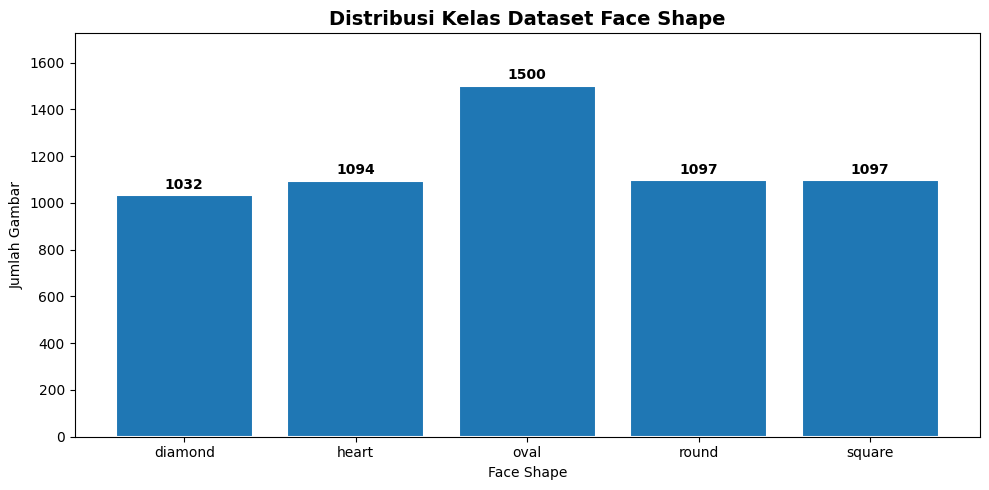

In [6]:
# Visualisasi distribusi kelas.
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(class_counts.keys(), class_counts.values(), edgecolor='white', linewidth=1.5)
ax.set_title('Distribusi Kelas Dataset Face Shape', fontsize=14, fontweight='bold')
ax.set_xlabel('Face Shape')
ax.set_ylabel('Jumlah Gambar')

for bar, count in zip(bars, class_counts.values()):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + max(class_counts.values()) * 0.01,
        str(count),
        ha='center',
        va='bottom',
        fontweight='bold'
    )

ax.set_ylim(0, max(class_counts.values()) * 1.15)
plt.tight_layout()
plt.show()

In [7]:
# Stratified split: 80% train, 10% validation, 10% test.
# Split ini lebih stabil dibanding membagi validation berdasarkan batch.

all_image_paths = np.array(all_image_paths)
all_labels = np.array(all_labels)

train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    all_image_paths,
    all_labels,
    test_size=0.20,
    random_state=SEED,
    stratify=all_labels
)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths,
    temp_labels,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_labels
)

print(f"Train samples : {len(train_paths)}")
print(f"Val samples   : {len(val_paths)}")
print(f"Test samples  : {len(test_paths)}")

print("\nDistribusi train:")
for idx, cls_name in enumerate(CLASS_NAMES):
    print(f"  {cls_name:10s}: {np.sum(train_labels == idx)}")

print("\nDistribusi validation:")
for idx, cls_name in enumerate(CLASS_NAMES):
    print(f"  {cls_name:10s}: {np.sum(val_labels == idx)}")

print("\nDistribusi test:")
for idx, cls_name in enumerate(CLASS_NAMES):
    print(f"  {cls_name:10s}: {np.sum(test_labels == idx)}")

Train samples : 4656
Val samples   : 582
Test samples  : 582

Distribusi train:
  diamond   : 826
  heart     : 875
  oval      : 1200
  round     : 878
  square    : 877

Distribusi validation:
  diamond   : 103
  heart     : 109
  oval      : 150
  round     : 110
  square    : 110

Distribusi test:
  diamond   : 103
  heart     : 110
  oval      : 150
  round     : 109
  square    : 110


In [8]:
# ==================== PIPELINE TF.DATA ====================

# AUTOTUNE membuat TensorFlow otomatis memilih jumlah proses yang efisien.
AUTOTUNE = tf.data.AUTOTUNE


def load_and_preprocess_image(path, label):
    """Memuat gambar, resize, dan mengubah label ke one-hot."""

    # Membaca file gambar dari path.
    image = tf.io.read_file(path)

    # Decode gambar menjadi tensor RGB.
    image = tf.image.decode_image(
        image,
        channels=3,
        expand_animations=False
    )

    # Menentukan shape channel agar TensorFlow tahu gambar memiliki 3 channel.
    image.set_shape([None, None, 3])

    # Resize gambar ke ukuran input model.
    image = tf.image.resize(
        image,
        [IMAGE_SIZE, IMAGE_SIZE],
        method='bilinear'
    )

    # Mengubah tipe data gambar menjadi float32.
    image = tf.cast(image, tf.float32)

    # Membatasi nilai pixel agar tetap berada pada rentang 0 sampai 255.
    image = tf.clip_by_value(
        image,
        0.0,
        255.0
    )

    # Mengubah label angka menjadi one-hot encoding.
    label = tf.one_hot(
        label,
        depth=NUM_CLASSES
    )

    return image, label


def build_dataset(paths, labels, training=False):
    """Membuat dataset TensorFlow dari path gambar dan label."""

    # Membuat dataset dari pasangan path gambar dan label.
    ds = tf.data.Dataset.from_tensor_slices(
        (
            paths.astype(str),
            labels.astype(np.int32)
        )
    )

    # Shuffle hanya digunakan pada data training.
    if training:
        ds = ds.shuffle(
            buffer_size=len(paths),
            seed=SEED,
            reshuffle_each_iteration=True
        )

    # Memuat dan memproses gambar secara paralel.
    ds = ds.map(
        load_and_preprocess_image,
        num_parallel_calls=AUTOTUNE
    )

    # Mengelompokkan data menjadi batch.
    ds = ds.batch(
        BATCH_SIZE,
        drop_remainder=False
    )

    # Prefetch membantu mempercepat training dengan menyiapkan batch berikutnya.
    ds = ds.prefetch(AUTOTUNE)

    return ds


# Membuat dataset untuk training, validation, dan testing.
train_ds = build_dataset(
    train_paths,
    train_labels,
    training=True
)

val_ds = build_dataset(
    val_paths,
    val_labels,
    training=False
)

test_ds = build_dataset(
    test_paths,
    test_labels,
    training=False
)


# Menghitung jumlah batch pada setiap dataset.
steps_per_epoch = math.ceil(len(train_paths) / BATCH_SIZE)
val_steps = math.ceil(len(val_paths) / BATCH_SIZE)
test_steps = math.ceil(len(test_paths) / BATCH_SIZE)


# Menghitung class weight agar kelas yang jumlah datanya lebih sedikit
# tetap mendapat perhatian saat training.
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.arange(NUM_CLASSES),
    y=train_labels
).astype('float32')


# Class weight dalam bentuk tensor untuk dipakai di custom training loop.
CLASS_WEIGHT_VECTOR = tf.constant(
    class_weights_array,
    dtype=tf.float32
)

# Class weight dalam bentuk dictionary agar mudah dibaca.
CLASS_WEIGHT_DICT = {
    CLASS_NAMES[i]: float(class_weights_array[i])
    for i in range(NUM_CLASSES)
}


# Menampilkan informasi dataset.
print(f"Train batches : {steps_per_epoch}")
print(f"Val batches   : {val_steps}")
print(f"Test batches  : {test_steps}")
print(f"Class weights : {CLASS_WEIGHT_DICT}")


Train batches : 146
Val batches   : 19
Test batches  : 19
Class weights : {'diamond': 1.1273608207702637, 'heart': 1.0642285346984863, 'oval': 0.7760000228881836, 'round': 1.0605922937393188, 'square': 1.061801552772522}


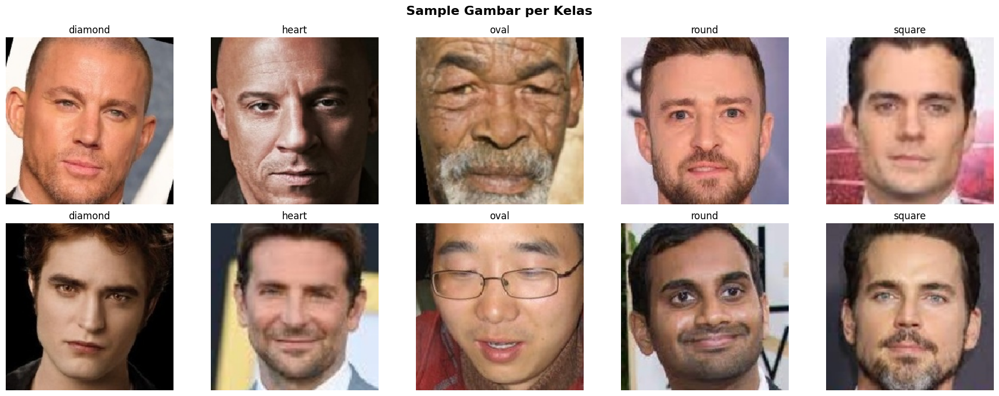

In [9]:
# Visualisasi sample gambar dari setiap kelas.
rows = 2
fig, axes = plt.subplots(rows, NUM_CLASSES, figsize=(3.6 * NUM_CLASSES, 7))
fig.suptitle('Sample Gambar per Kelas', fontsize=16, fontweight='bold')

if NUM_CLASSES == 1:
    axes = np.expand_dims(axes, axis=1)

for cls_idx, cls_name in enumerate(CLASS_NAMES):
    cls_paths = train_paths[train_labels == cls_idx][:rows]

    for row in range(rows):
        ax = axes[row, cls_idx]
        ax.axis('off')

        if row < len(cls_paths):
            img = tf.keras.utils.load_img(cls_paths[row], target_size=(IMAGE_SIZE, IMAGE_SIZE))
            ax.imshow(img)
            ax.set_title(cls_name, fontsize=12)

plt.tight_layout()
plt.show()

---
## Section 3: Custom Components

Implementasi tiga komponen kustom lanjutan:
1. **Custom Layer** - `SpatialAttentionLayer`
2. **Custom Loss** - `FocalCrossEntropyLoss`
3. **Custom Callback** - `DetailedMetricsCallback`

### 3.1 Custom Layer - SpatialAttentionLayer

Spatial Attention mempelajari **region mana** pada feature map yang paling penting.
Ini membantu model fokus pada kontur wajah - yang merupakan fitur kunci untuk
menentukan bentuk wajah (diamond vs oval vs round, dll).

Mekanisme:
1. Compute average pooling & max pooling sepanjang channel axis
2. Concatenate kedua pooling
3. Konvolusi 7×7 -> sigmoid -> attention map
4. Multiply feature map dengan attention map

In [10]:
@tf.keras.utils.register_keras_serializable(package="FaceShape")
class SpatialAttentionLayer(tf.keras.layers.Layer):
    """Custom layer untuk spatial attention."""

    def __init__(self, kernel_size=7, **kwargs):
        super().__init__(**kwargs)

        # Ukuran kernel convolution untuk membuat attention map.
        # Kernel 7x7 memberi area pandang yang cukup luas pada feature map.
        self.kernel_size = kernel_size

    def build(self, input_shape):
        # Conv2D ini menghasilkan attention map dengan 1 channel.
        # Attention map berisi nilai 0 sampai 1 karena memakai sigmoid.
        # Nilai mendekati 1 berarti area tersebut dianggap penting.
        # Nilai mendekati 0 berarti area tersebut dianggap kurang penting.
        self.conv = tf.keras.layers.Conv2D(
            filters=1,
            kernel_size=self.kernel_size,
            strides=1,
            padding='same',
            activation='sigmoid',
            kernel_initializer='glorot_uniform',
            name=self.name + '_conv'
        )

        # Input untuk conv attention memiliki 2 channel:
        # channel pertama dari average pooling,
        # channel kedua dari max pooling.
        self.conv.build((input_shape[0], input_shape[1], input_shape[2], 2))

        # Menandai bahwa proses build layer sudah selesai.
        super().build(input_shape)

    def call(self, inputs):
        # Average pooling pada dimensi channel.
        # Tujuannya mengambil informasi rata-rata dari semua channel fitur.
        avg_pool = tf.reduce_mean(
            inputs,
            axis=-1,
            keepdims=True
        )

        # Max pooling pada dimensi channel.
        # Tujuannya mengambil respons fitur paling kuat pada setiap posisi.
        max_pool = tf.reduce_max(
            inputs,
            axis=-1,
            keepdims=True
        )

        # Menggabungkan average pooling dan max pooling.
        # Hasilnya memiliki 2 channel.
        concat = tf.concat(
            [avg_pool, max_pool],
            axis=-1
        )

        # Conv2D menghasilkan attention map 2D.
        # Bentuk attention map mengikuti tinggi dan lebar feature map input.
        attention_map = self.conv(concat)

        # Feature map input dikalikan dengan attention map.
        # Area penting diperkuat, area kurang penting dilemahkan.
        return inputs * attention_map

    def get_config(self):
        # Konfigurasi diperlukan agar custom layer bisa disimpan
        # dan dimuat kembali saat loading model.
        config = super().get_config()
        config.update({"kernel_size": self.kernel_size})
        return config


# Membuat input dummy untuk menguji SpatialAttentionLayer.
# Shape: batch_size=1, tinggi=28, lebar=28, channel=64.
test_input = tf.random.normal((1, 28, 28, 64))

# Membuat instance SpatialAttentionLayer.
attn_layer = SpatialAttentionLayer(
    kernel_size=7,
    name='test_attn'
)

# Melewatkan input dummy ke attention layer.
test_output = attn_layer(test_input)

# Mengecek apakah shape input dan output tetap sama.
# Spatial attention hanya memberi bobot pada feature map,
# bukan mengubah ukuran feature map.
print(f"Input shape : {test_input.shape}")
print(f"Output shape: {test_output.shape}")

# Jika kode berjalan tanpa error, berarti custom layer berhasil dibuat.
print("SpatialAttentionLayer berhasil dibuat.")

Input shape : (1, 28, 28, 64)
Output shape: (1, 28, 28, 64)
SpatialAttentionLayer berhasil dibuat.


### 3.2 Custom Loss Function - FocalCrossEntropyLoss

**Focal Loss** mengurangi bobot pada easy-to-classify samples dan fokus pada
hard-to-classify samples. Ini membantu karena:
- Dataset memiliki sedikit imbalance (oval=1500, diamond=1032)
- Beberapa kelas mirip (heart vs oval, round vs square)

Formula: `FL(p) = -α * (1-p)^γ * log(p)`
- `γ (gamma)`: focusing parameter, mengurangi loss untuk easy examples
- `α (alpha)`: class weighting factor

In [11]:
@tf.keras.utils.register_keras_serializable(package="FaceShape")
class FocalCrossEntropyLoss(tf.keras.losses.Loss):
    """Focal loss untuk klasifikasi multi-class."""

    def __init__(self, gamma=1.5, alpha=1.0, label_smoothing=0.0, **kwargs):
        # Reduction.NONE membuat loss dikembalikan per-sample.
        super().__init__(reduction=tf.keras.losses.Reduction.NONE, **kwargs)

        # Gamma mengatur seberapa besar fokus diberikan pada sample sulit.
        # Semakin besar gamma, semakin besar penekanan pada prediksi yang salah
        # atau prediksi yang masih kurang yakin.
        self.gamma = gamma

        # Alpha adalah faktor pengali loss.
        self.alpha = alpha

        # Label smoothing dapat digunakan untuk membuat target label
        # tidak terlalu keras, tetapi pada kode ini default-nya 0.0.
        self.label_smoothing = label_smoothing

    def call(self, y_true, y_pred):
        # Membatasi nilai prediksi agar tidak tepat 0 atau 1.
        # Ini mencegah error log(0) saat menghitung cross-entropy.
        y_pred = tf.clip_by_value(
            y_pred,
            tf.keras.backend.epsilon(),
            1.0 - tf.keras.backend.epsilon()
        )

        # Jika label smoothing aktif, label one-hot dibuat sedikit lebih halus.
        # Contoh tanpa smoothing:
        # [1, 0, 0, 0, 0]
        #
        # Dengan smoothing, nilai 1 sedikit diturunkan dan kelas lain
        # mendapat nilai kecil.
        if self.label_smoothing > 0:
            num_classes = tf.cast(tf.shape(y_true)[-1], tf.float32)
            y_true = y_true * (1.0 - self.label_smoothing) + (
                self.label_smoothing / num_classes
            )

        # Menghitung cross-entropy manual untuk setiap sample.
        # y_true berisi label one-hot, sedangkan y_pred berisi probabilitas.
        cross_entropy = -tf.reduce_sum(
            y_true * tf.math.log(y_pred),
            axis=-1
        )

        # Mengambil probabilitas model pada kelas yang benar.
        # Jika prediksi benar dan yakin, nilainya mendekati 1.
        # Jika prediksi salah atau ragu, nilainya lebih kecil.
        true_class_prob = tf.reduce_sum(
            y_true * y_pred,
            axis=-1
        )

        # Focal weight mengecilkan kontribusi sample yang mudah
        # dan memperbesar perhatian pada sample yang sulit.
        #
        # Jika true_class_prob tinggi, maka focal_weight kecil.
        # Jika true_class_prob rendah, maka focal_weight besar.
        focal_weight = tf.pow(
            1.0 - true_class_prob,
            self.gamma
        )

        # Loss akhir adalah cross-entropy yang diberi focal weight.
        return self.alpha * focal_weight * cross_entropy

    def get_config(self):
        # Konfigurasi ini diperlukan agar custom loss bisa disimpan
        # dan dimuat kembali bersama model.
        config = super().get_config()

        config.update({
            "gamma": self.gamma,
            "alpha": self.alpha,
            "label_smoothing": self.label_smoothing,
        })

        return config


# Membuat instance focal loss dengan parameter yang digunakan pada training.
focal_loss_fn = FocalCrossEntropyLoss(
    gamma=1.5,
    alpha=1.0,
    label_smoothing=0.0
)

# Contoh label asli dalam format one-hot.
# Sample pertama adalah kelas index 0.
# Sample kedua adalah kelas index 1.
y_true_test = tf.constant(
    [
        [1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0]
    ],
    dtype=tf.float32
)

# Contoh prediksi model dalam bentuk probabilitas.
# Sample pertama cukup yakin pada kelas 0 dengan probabilitas 0.9.
# Sample kedua cukup yakin pada kelas 1 dengan probabilitas 0.7.
y_pred_test = tf.constant(
    [
        [0.9, 0.02, 0.03, 0.03, 0.02],
        [0.1, 0.7, 0.1, 0.05, 0.05]
    ],
    dtype=tf.float32
)

# Menghitung nilai focal loss untuk setiap sample.
loss_val = focal_loss_fn(y_true_test, y_pred_test)

# Menampilkan nilai loss per-sample.
print(f"Focal Loss values: {loss_val.numpy()}")

# Jika kode berjalan tanpa error, custom loss berhasil dibuat.
print("FocalCrossEntropyLoss berhasil dibuat.")


Focal Loss values: [0.00333179 0.05860768]
FocalCrossEntropyLoss berhasil dibuat.


### 3.3 Custom Callback - DetailedMetricsCallback

Callback kustom yang:
- Menghitung **per-class precision, recall, F1-score**
- Menghasilkan **confusion matrix** sebagai gambar
- Menyimpan **weight histogram** per layer
- Log semua metrik ke **TensorBoard**
- Digunakan di dalam custom training loop (dipanggil manual)

In [12]:
class DetailedMetricsCallback(tf.keras.callbacks.Callback):
    """Callback untuk mencatat metrik evaluasi detail."""

    def __init__(self, class_names, log_dir, log_every_n_epochs=5):
        super().__init__()

        # Menyimpan daftar nama kelas, misalnya:
        # diamond, heart, oval, round, square.
        self.class_names = class_names

        # Direktori utama untuk menyimpan log TensorBoard.
        self.log_dir = log_dir

        # Mengatur seberapa sering confusion matrix dan histogram dicatat.
        # Contoh: jika nilainya 5, maka logging dilakukan setiap 5 epoch.
        self.log_every_n_epochs = log_every_n_epochs

        # Membuat writer khusus untuk menyimpan metrik detail ke TensorBoard.
        self.metrics_writer = tf.summary.create_file_writer(
            os.path.join(log_dir, 'detailed_metrics')
        )

    def _create_confusion_matrix_image(self, cm, epoch):
        """Membuat gambar confusion matrix."""

        # Membuat figure matplotlib untuk visualisasi confusion matrix.
        fig, ax = plt.subplots(figsize=(8, 6))

        # Menampilkan confusion matrix dalam bentuk heatmap.
        # annot=True menampilkan angka pada setiap kotak.
        # fmt='d' berarti angka ditampilkan sebagai integer.
        sns.heatmap(
            cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=self.class_names,
            yticklabels=self.class_names,
            ax=ax,
            linewidths=0.5
        )

        # Memberi label dan judul pada confusion matrix.
        ax.set_xlabel('Predicted Label', fontsize=12)
        ax.set_ylabel('True Label', fontsize=12)
        ax.set_title(f'Confusion Matrix - Epoch {epoch + 1}', fontsize=14)

        # Mengatur layout agar tampilan tidak terpotong.
        plt.tight_layout()

        # Menyimpan gambar ke buffer memory, bukan ke file langsung.
        # Buffer ini nantinya akan dibaca oleh TensorFlow untuk TensorBoard.
        buf = io.BytesIO()
        fig.savefig(buf, format='png', dpi=100, bbox_inches='tight')

        # Menutup figure agar tidak menumpuk di memory.
        plt.close(fig)

        # Mengembalikan posisi pointer buffer ke awal.
        buf.seek(0)

        # Decode gambar PNG menjadi tensor.
        image = tf.image.decode_png(buf.getvalue(), channels=4)

        # TensorBoard membutuhkan bentuk batch image:
        # [batch, height, width, channels]
        return tf.expand_dims(image, 0)

    def log_epoch_metrics(self, epoch, model, val_dataset):
        """Menghitung dan mencatat metrik validasi per epoch."""

        # List untuk menyimpan label asli dan hasil prediksi.
        y_true_list, y_pred_list = [], []

        # Melakukan prediksi pada seluruh validation dataset.
        for images, labels in val_dataset:
            # training=False memastikan layer seperti dropout dan augmentasi
            # tidak aktif saat evaluasi.
            predictions = model(images, training=False)

            # Mengubah label one-hot menjadi index kelas.
            y_true_list.append(tf.argmax(labels, axis=1).numpy())

            # Mengambil index kelas dengan probabilitas tertinggi.
            y_pred_list.append(tf.argmax(predictions, axis=1).numpy())

        # Menggabungkan seluruh batch menjadi satu array.
        y_true = np.concatenate(y_true_list)
        y_pred = np.concatenate(y_pred_list)

        # Membuat confusion matrix dari label asli dan prediksi.
        cm = sk_confusion_matrix(
            y_true,
            y_pred,
            labels=np.arange(len(self.class_names))
        )

        # Menulis metrik ke TensorBoard.
        with self.metrics_writer.as_default():

            # Menghitung precision, recall, dan F1-score untuk setiap kelas.
            for i, name in enumerate(self.class_names):
                # True positive untuk kelas i.
                tp = cm[i, i]

                # False positive:
                # jumlah prediksi sebagai kelas i, tetapi label aslinya bukan i.
                fp = cm[:, i].sum() - tp

                # False negative:
                # jumlah label asli kelas i, tetapi diprediksi sebagai kelas lain.
                fn = cm[i, :].sum() - tp

                # Precision menunjukkan seberapa tepat prediksi untuk kelas tersebut.
                precision = tp / (tp + fp + 1e-7)

                # Recall menunjukkan seberapa banyak data kelas tersebut
                # yang berhasil dikenali dengan benar.
                recall = tp / (tp + fn + 1e-7)

                # F1-score adalah rata-rata harmonik antara precision dan recall.
                f1 = 2 * precision * recall / (precision + recall + 1e-7)

                # Mencatat metrik per kelas ke TensorBoard.
                tf.summary.scalar(
                    f'per_class_precision/{name}',
                    precision,
                    step=epoch
                )

                tf.summary.scalar(
                    f'per_class_recall/{name}',
                    recall,
                    step=epoch
                )

                tf.summary.scalar(
                    f'per_class_f1/{name}',
                    f1,
                    step=epoch
                )

            # Mencatat confusion matrix pada epoch pertama
            # dan setiap kelipatan log_every_n_epochs.
            if (epoch + 1) % self.log_every_n_epochs == 0 or epoch == 0:
                cm_image = self._create_confusion_matrix_image(cm, epoch)

                tf.summary.image(
                    'confusion_matrix',
                    cm_image,
                    step=epoch
                )

            # Mencatat histogram bobot model setiap beberapa epoch.
            # Ini membantu memantau distribusi bobot selama training.
            if (epoch + 1) % self.log_every_n_epochs == 0:
                for layer in model.layers:
                    for weight in layer.trainable_weights:
                        tf.summary.histogram(
                            f'weights/{weight.name}',
                            weight,
                            step=epoch
                        )

        # Memastikan semua log ditulis ke disk.
        self.metrics_writer.flush()

        # Mengembalikan confusion matrix dan label untuk analisis tambahan.
        return cm, y_true, y_pred


# Jika kode berjalan tanpa error, berarti custom callback berhasil dibuat.
print("DetailedMetricsCallback berhasil didefinisikan.")

DetailedMetricsCallback berhasil didefinisikan.


---
## Section 4: Model Architecture - Scratch CNN

Model dibuat dari nol tanpa transfer learning.

Perubahan utama:
- Stratified split agar validasi dan test lebih stabil
- Residual CNN block dari scratch
- Squeeze-and-Excitation block dari scratch
- Spatial attention custom layer
- Temperature softmax agar prediksi lebih tegas saat model sudah benar
- Dropout dan AdamW weight decay untuk mengurangi overfitting

In [13]:
@tf.keras.utils.register_keras_serializable(package="FaceShape")
class TemperatureSoftmax(tf.keras.layers.Layer):
    """Layer softmax dengan pengaturan temperature."""

    def __init__(self, temperature=1.0, **kwargs):
        super().__init__(**kwargs)

        # Temperature mengatur ketajaman distribusi probabilitas.
        # Nilai lebih kecil membuat output lebih tegas.
        self.temperature = float(temperature)

    def call(self, logits):
        # Logits adalah skor mentah dari layer Dense terakhir.
        # Softmax mengubah logits menjadi probabilitas untuk setiap kelas.
        return tf.nn.softmax(logits / self.temperature, axis=-1)

    def get_config(self):
        # Konfigurasi ini dibutuhkan agar custom layer bisa disimpan
        # dan dimuat kembali saat loading model.
        config = super().get_config()
        config.update({"temperature": self.temperature})
        return config


def conv_bn_act(x, filters, kernel_size=3, strides=1, name='conv'):
    """Blok Conv2D, BatchNormalization, dan aktivasi Swish."""

    # Conv2D mengekstraksi fitur visual dari gambar,
    # seperti garis, tepi, tekstur, dan pola wajah.
    x = tf.keras.layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        padding='same',
        use_bias=False,
        kernel_initializer='he_normal',
        name=f'{name}_conv'
    )(x)

    # BatchNormalization membantu training lebih stabil.
    x = tf.keras.layers.BatchNormalization(
        momentum=0.9,
        epsilon=1e-5,
        name=f'{name}_bn'
    )(x)

    # Swish digunakan sebagai fungsi aktivasi non-linear.
    x = tf.keras.layers.Activation(
        'swish',
        name=f'{name}_swish'
    )(x)

    return x


def squeeze_excite_block(x, ratio=8, name='se'):
    """Blok untuk memberi bobot pada channel fitur penting."""

    # Jumlah channel pada feature map input.
    filters = int(x.shape[-1])

    # Merangkum setiap channel menjadi satu nilai.
    # Ini membantu model mengetahui channel mana yang lebih penting.
    se = tf.keras.layers.GlobalAveragePooling2D(
        name=f'{name}_gap'
    )(x)

    # Dense pertama mengurangi dimensi channel.
    se = tf.keras.layers.Dense(
        max(filters // ratio, 8),
        activation='swish',
        name=f'{name}_fc1'
    )(se)

    # Dense kedua mengembalikan dimensi ke jumlah channel asli.
    # Sigmoid menghasilkan bobot 0 sampai 1 untuk setiap channel.
    se = tf.keras.layers.Dense(
        filters,
        activation='sigmoid',
        name=f'{name}_fc2'
    )(se)

    # Mengubah bentuk vektor agar bisa dikalikan dengan feature map.
    se = tf.keras.layers.Reshape(
        (1, 1, filters),
        name=f'{name}_reshape'
    )(se)

    # Feature map dikalikan dengan bobot channel.
    # Channel yang penting diperkuat, channel yang kurang penting dilemahkan.
    return tf.keras.layers.Multiply(
        name=f'{name}_scale'
    )([x, se])


def residual_block(x, filters, strides=1, drop_rate=0.0, name='res'):
    """Residual block dengan Squeeze-and-Excitation."""

    # Shortcut menyimpan input awal untuk residual connection.
    shortcut = x

    # Convolution pertama.
    # Jika strides=2, ukuran feature map akan diperkecil.
    x = conv_bn_act(
        x,
        filters,
        kernel_size=3,
        strides=strides,
        name=f'{name}_conv1'
    )

    # Convolution kedua tanpa aktivasi langsung.
    # Aktivasi dilakukan setelah penjumlahan dengan shortcut.
    x = tf.keras.layers.Conv2D(
        filters,
        3,
        strides=1,
        padding='same',
        use_bias=False,
        kernel_initializer='he_normal',
        name=f'{name}_conv2'
    )(x)

    x = tf.keras.layers.BatchNormalization(
        momentum=0.9,
        epsilon=1e-5,
        name=f'{name}_bn2'
    )(x)

    # Squeeze-and-Excitation membantu model memilih channel fitur penting.
    x = squeeze_excite_block(
        x,
        ratio=8,
        name=f'{name}_se'
    )

    # Jika ukuran atau jumlah channel shortcut berbeda,
    # shortcut harus disesuaikan agar bisa dijumlahkan dengan x.
    if strides != 1 or int(shortcut.shape[-1]) != filters:
        shortcut = tf.keras.layers.Conv2D(
            filters,
            1,
            strides=strides,
            padding='same',
            use_bias=False,
            kernel_initializer='he_normal',
            name=f'{name}_skip_conv'
        )(shortcut)

        shortcut = tf.keras.layers.BatchNormalization(
            momentum=0.9,
            epsilon=1e-5,
            name=f'{name}_skip_bn'
        )(shortcut)

    # Residual connection: output convolution ditambah shortcut.
    x = tf.keras.layers.Add(
        name=f'{name}_add'
    )([x, shortcut])

    # Aktivasi setelah residual addition.
    x = tf.keras.layers.Activation(
        'swish',
        name=f'{name}_out'
    )(x)

    # Dropout digunakan untuk mengurangi overfitting.
    if drop_rate > 0:
        x = tf.keras.layers.Dropout(
            drop_rate,
            name=f'{name}_dropout'
        )(x)

    return x


def build_face_shape_model(num_classes, image_size):
    """Membangun model CNN klasifikasi bentuk wajah dari scratch."""

    # Input model berupa gambar RGB.
    # Contoh: jika image_size = 224, maka shape input adalah 224 x 224 x 3.
    inputs = tf.keras.Input(
        shape=(image_size, image_size, 3),
        name='input_image'
    )

    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    # Preprocessing dan augmentasi
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~

    # Mengubah nilai piksel dari 0-255 menjadi 0-1.
    x = tf.keras.layers.Rescaling(
        1.0 / 255.0,
        name='rescaling'
    )(inputs)

    # Augmentasi hanya aktif saat training.
    # Tujuannya agar model lebih tahan terhadap variasi gambar.
    x = tf.keras.layers.RandomFlip(
        'horizontal',
        name='aug_flip'
    )(x)

    # Rotasi kecil untuk mengurangi sensitivitas terhadap kemiringan wajah.
    x = tf.keras.layers.RandomRotation(
        0.12,
        fill_mode='nearest',
        name='aug_rotate'
    )(x)

    # Zoom acak untuk meniru variasi jarak wajah terhadap kamera.
    x = tf.keras.layers.RandomZoom(
        height_factor=(-0.15, 0.10),
        width_factor=(-0.15, 0.10),
        fill_mode='nearest',
        name='aug_zoom'
    )(x)

    # Translasi acak untuk meniru pergeseran posisi wajah.
    x = tf.keras.layers.RandomTranslation(
        height_factor=0.06,
        width_factor=0.06,
        fill_mode='nearest',
        name='aug_translate'
    )(x)

    # Kontras acak untuk membuat model lebih tahan terhadap perubahan cahaya.
    x = tf.keras.layers.RandomContrast(
        0.18,
        name='aug_contrast'
    )(x)

    # ~~~~~~~
    # Stem
    # ~~~~~~~

    # Stem adalah tahap awal ekstraksi fitur.
    # Ukuran feature map turun dari 224 x 224 menjadi 112 x 112.
    x = conv_bn_act(
        x,
        32,
        kernel_size=3,
        strides=2,
        name='stem1'
    )  # 224 -> 112

    # Blok kedua mempertahankan ukuran 112 x 112.
    x = conv_bn_act(
        x,
        48,
        kernel_size=3,
        strides=1,
        name='stem2'
    )  # 112 -> 112

    # ~~~~~~~~~
    # Stage 1
    # ~~~~~~~~~

    # Stage 1 mulai menangkap fitur sederhana,
    # seperti garis, tepi, dan kontur awal wajah.
    x = residual_block(
        x,
        64,
        strides=2,
        drop_rate=0.02,
        name='stage1_block1'
    )  # 112 -> 56

    x = residual_block(
        x,
        64,
        strides=1,
        drop_rate=0.02,
        name='stage1_block2'
    )

    # ~~~~~~~~~~
    # Stage 2
    # ~~~~~~~~~~

    # Stage 2 menangkap pola yang lebih kompleks,
    # seperti area pipi, rahang, dan dagu.
    x = residual_block(
        x,
        96,
        strides=2,
        drop_rate=0.04,
        name='stage2_block1'
    )  # 56 -> 28

    x = residual_block(
        x,
        96,
        strides=1,
        drop_rate=0.04,
        name='stage2_block2'
    )

    # Spatial attention membantu model menekankan area penting
    # pada feature map, misalnya area wajah dan kontur.
    x = SpatialAttentionLayer(
        kernel_size=7,
        name='spatial_attention_1'
    )(x)

    # ~~~~~~~~~~
    # Stage 3
    # ~~~~~~~~~~

    # Stage 3 belajar fitur yang semakin abstrak,
    # seperti pola keseluruhan bentuk wajah.
    x = residual_block(
        x,
        160,
        strides=2,
        drop_rate=0.06,
        name='stage3_block1'
    )  # 28 -> 14

    x = residual_block(
        x,
        160,
        strides=1,
        drop_rate=0.06,
        name='stage3_block2'
    )

    # Jumlah filter dinaikkan agar model punya kapasitas fitur lebih besar.
    x = residual_block(
        x,
        224,
        strides=1,
        drop_rate=0.08,
        name='stage3_block3'
    )

    # Attention kedua diberikan setelah fitur menjadi lebih kompleks.
    x = SpatialAttentionLayer(
        kernel_size=7,
        name='spatial_attention_2'
    )(x)

    # ~~~~~~~~~
    # Stage 4
    # =~~~~~~~~

    # Stage 4 menangkap fitur tingkat tinggi.
    # Ukuran feature map turun menjadi 7 x 7.
    x = residual_block(
        x,
        320,
        strides=2,
        drop_rate=0.10,
        name='stage4_block1'
    )  # 14 -> 7

    x = residual_block(
        x,
        320,
        strides=1,
        drop_rate=0.10,
        name='stage4_block2'
    )

    # ~~~~~~~~~~~~~~~~~~~~~
    # Classification head
    # ~~~~~~~~~~~~~~~~~~~~~

    # Mengubah feature map menjadi satu vektor fitur global.
    x = tf.keras.layers.GlobalAveragePooling2D(
        name='global_avg_pool'
    )(x)

    # Dropout untuk mengurangi overfitting.
    x = tf.keras.layers.Dropout(
        0.35,
        name='head_dropout1'
    )(x)

    # Dense layer untuk mempelajari kombinasi fitur global.
    x = tf.keras.layers.Dense(
        384,
        kernel_initializer='he_normal',
        name='head_fc1'
    )(x)

    x = tf.keras.layers.BatchNormalization(
        momentum=0.9,
        epsilon=1e-5,
        name='head_bn1'
    )(x)

    x = tf.keras.layers.Activation(
        'swish',
        name='head_swish1'
    )(x)

    # Dropout tambahan pada classification head.
    x = tf.keras.layers.Dropout(
        0.25,
        name='head_dropout2'
    )(x)

    # Dense terakhir menghasilkan logits.
    # Jumlah logits sama dengan jumlah kelas.
    logits = tf.keras.layers.Dense(
        num_classes,
        kernel_initializer='glorot_uniform',
        name='logits'
    )(x)

    # Softmax mengubah logits menjadi probabilitas setiap kelas.
    outputs = TemperatureSoftmax(
        temperature=SOFTMAX_TEMPERATURE,
        name='output'
    )(logits)

    # Model dibuat menggunakan TensorFlow Functional API.
    model = tf.keras.Model(
        inputs=inputs,
        outputs=outputs,
        name='FaceShapeScratchNetV2'
    )

    return model


# Membuat model berdasarkan jumlah kelas dan ukuran gambar.
model = build_face_shape_model(NUM_CLASSES, IMAGE_SIZE)

# Menampilkan ringkasan arsitektur model.
model.summary()

Model: "FaceShapeScratchNetV2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_image[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aug_flip            │ (None, 224, 224,  │          0 │ rescaling[0][0]   │
│ (RandomFlip)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aug_rotate          │ (None, 224, 224,  │          0 │ aug_flip[0][0]    │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aug_zoom            │ (None, 224, 224,  │          0 │ aug_rotate[0][0]  │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aug_translate       │ (None, 224, 224,  │          0 │ aug_zoom[0][0]    │
│ (RandomTranslation) │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aug_contrast        │ (None, 224, 224,  │          0 │ aug_translate[0]… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem1_conv (Conv2D) │ (None, 112, 112,  │        864 │ aug_contrast[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem1_bn            │ (None, 112, 112,  │        128 │ stem1_conv[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem1_swish         │ (None, 112, 112,  │          0 │ stem1_bn[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem2_conv (Conv2D) │ (None, 112, 112,  │     13,824 │ stem1_swish[0][0] │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem2_bn            │ (None, 112, 112,  │        192 │ stem2_conv[0][0]  │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem2_swish         │ (None, 112, 112,  │          0 │ stem2_bn[0][0]    │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_block1_conv… │ (None, 56, 56,    │     27,648 │ stem2_swish[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_block1_conv… │ (None, 56, 56,    │        256 │ stage1_block1_co… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_block1_conv… │ (None, 56, 56,    │          0 │ stage1_block1_co… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_block1_conv2 │ (None, 56, 56,    │     36,864 │ stage1_block1_co

 Total params: 5,830,279 (22.24 MB)

 Trainable params: 5,821,607 (22.21 MB)

 Non-trainable params: 8,672 (33.88 KB)

In [14]:
# Visualisasi arsitektur model.
arch_path = os.path.join(MODEL_DIR, 'model_architecture.png')

try:
    tf.keras.utils.plot_model(
        model,
        to_file=arch_path,
        show_shapes=True,
        show_layer_names=True,
        dpi=80
    )
    print(f"Arsitektur model disimpan: {arch_path}")
except Exception as e:
    print(f"Plot arsitektur dilewati: {e}")

print(f"Total parameters    : {model.count_params():,}")
print(f"Trainable parameters: "
      f"{sum(tf.keras.backend.count_params(w) for w in model.trainable_weights):,}")

Plot arsitektur dilewati: [Errno 2] No such file or directory: '/content/drive/MyDrive/dataset_after_balancing/models_notebook/model_architecture.png'
Total parameters    : 5,830,279
Trainable parameters: 5,821,607


---
## Section 5: Custom Training Loop - tf.GradientTape

Training tetap menggunakan custom loop agar prosesnya transparan.

Fitur:
- Forward pass dan backward pass manual
- Class weight untuk menjaga kontribusi tiap kelas
- Focal loss dari scratch
- Entropy confidence regularization untuk membantu target MAE
- AdamW + warmup cosine decay
- Early stopping manual
- Model checkpoint
- TensorBoard
- Progress bar batch training dan validation di output

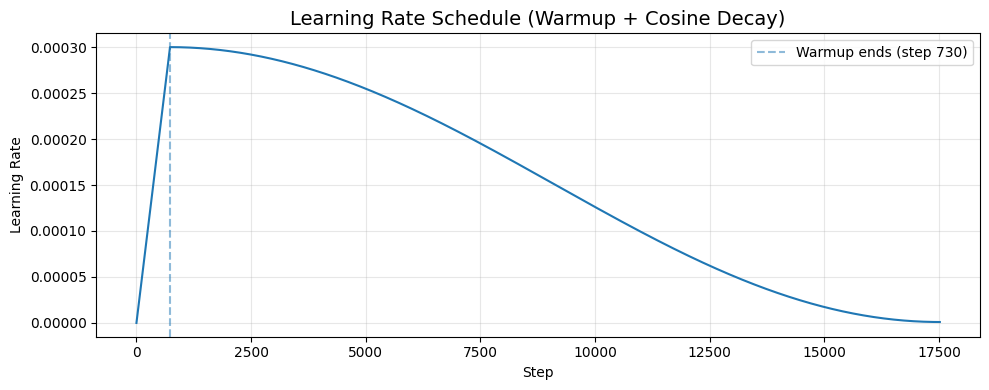

In [15]:
# ==================== LEARNING RATE SCHEDULE ====================

# Total step training dihitung dari jumlah batch per epoch dikali jumlah epoch.
total_steps = steps_per_epoch * EPOCHS

# Warmup step dihitung dari jumlah batch per epoch dikali jumlah epoch warmup.
warmup_steps = steps_per_epoch * WARMUP_EPOCHS


class WarmupCosineDecaySchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    """Learning rate schedule dengan warmup dan cosine decay."""

    def __init__(self, initial_lr, min_lr, warmup_steps, total_steps):
        super().__init__()

        # Learning rate awal setelah fase warmup selesai.
        self.initial_lr = float(initial_lr)

        # Learning rate minimum pada akhir cosine decay.
        self.min_lr = float(min_lr)

        # Jumlah step yang digunakan untuk menaikkan learning rate secara bertahap.
        self.warmup_steps = tf.cast(warmup_steps, tf.float32)

        # Total step keseluruhan selama training.
        self.total_steps = tf.cast(total_steps, tf.float32)

    def __call__(self, step):
        # Mengubah step menjadi float agar bisa digunakan dalam operasi TensorFlow.
        step = tf.cast(step, tf.float32)

        # Fase warmup:
        # learning rate dinaikkan secara linear dari 0 sampai initial_lr.
        warmup_lr = self.initial_lr * (
            step / (self.warmup_steps + 1e-7)
        )

        # Progress training setelah warmup.
        # Nilainya berada pada rentang 0 sampai 1.
        progress = (
            (step - self.warmup_steps) /
            (self.total_steps - self.warmup_steps + 1e-7)
        )

        # Membatasi progress agar tidak kurang dari 0 atau lebih dari 1.
        progress = tf.clip_by_value(
            progress,
            0.0,
            1.0
        )

        # Fase cosine decay:
        # setelah warmup, learning rate diturunkan perlahan dari initial_lr
        # menuju min_lr mengikuti pola cosine.
        cosine_lr = self.min_lr + 0.5 * (
            self.initial_lr - self.min_lr
        ) * (
            1.0 + tf.cos(np.pi * progress)
        )

        # Jika masih dalam fase warmup, gunakan warmup_lr.
        # Jika warmup selesai, gunakan cosine_lr.
        return tf.where(
            step < self.warmup_steps,
            warmup_lr,
            cosine_lr
        )

    def get_config(self):
        # Konfigurasi ini diperlukan agar schedule bisa disimpan
        # dan direkonstruksi kembali jika dibutuhkan.
        return {
            "initial_lr": self.initial_lr,
            "min_lr": self.min_lr,
            "warmup_steps": int(self.warmup_steps.numpy()),
            "total_steps": int(self.total_steps.numpy()),
        }


# Membuat learning rate schedule berdasarkan parameter training.
lr_schedule = WarmupCosineDecaySchedule(
    INITIAL_LR,
    MIN_LR,
    warmup_steps,
    total_steps
)


# ==================== VISUALISASI LEARNING RATE ====================

# Mengambil nilai learning rate untuk setiap step training.
lr_values = [
    lr_schedule(step).numpy()
    for step in range(int(total_steps))
]

# Membuat plot untuk melihat perubahan learning rate selama training.
plt.figure(figsize=(10, 4))

# Menampilkan kurva learning rate.
plt.plot(lr_values)

# Judul dan label grafik.
plt.title(
    'Learning Rate Schedule (Warmup + Cosine Decay)',
    fontsize=14
)
plt.xlabel('Step')
plt.ylabel('Learning Rate')

# Garis vertikal untuk menunjukkan akhir fase warmup.
plt.axvline(
    x=warmup_steps,
    linestyle='--',
    alpha=0.5,
    label=f'Warmup ends (step {warmup_steps})'
)

# Menampilkan legenda dan grid agar grafik lebih mudah dibaca.
plt.legend()
plt.grid(True, alpha=0.3)

# Merapikan layout grafik.
plt.tight_layout()

# Menampilkan grafik.
plt.show()


In [16]:
# ==================== SETUP TRAINING ====================

# Optimizer utama yang digunakan adalah AdamW.
# AdamW dipilih karena mendukung weight decay secara langsung,
# sehingga dapat membantu mengurangi overfitting.
try:
    optimizer = tf.keras.optimizers.AdamW(
        learning_rate=lr_schedule,

        # Weight decay memberi penalti pada bobot model agar tidak terlalu besar.
        weight_decay=WEIGHT_DECAY,

        # Gradient clipping membatasi nilai gradien maksimum.
        # Ini membantu training lebih stabil dan mencegah exploding gradient.
        clipnorm=1.0
    )

    # Nama optimizer disimpan untuk ditampilkan pada ringkasan training.
    optimizer_name = "AdamW"

# Jika AdamW tidak tersedia pada versi TensorFlow tertentu,
# maka optimizer akan diganti menjadi Adam sebagai fallback.
except Exception:
    optimizer = tf.keras.optimizers.Adam(
        learning_rate=lr_schedule,

        # Gradient clipping tetap digunakan walaupun optimizer fallback adalah Adam.
        clipnorm=1.0
    )

    optimizer_name = "Adam"


# Membuat fungsi loss utama.
# Focal loss membantu model lebih fokus pada sample yang sulit diklasifikasikan.
focal_loss_fn = FocalCrossEntropyLoss(
    gamma=1.5,
    alpha=1.0,
    label_smoothing=0.0
)


# ==================== METRICS ====================

# Metrik untuk data training.
# Mean digunakan untuk menghitung rata-rata loss per epoch.
train_loss_metric = tf.keras.metrics.Mean(name='train_loss')

# CategoricalAccuracy cocok karena label berbentuk one-hot.
train_acc_metric = tf.keras.metrics.CategoricalAccuracy(name='train_accuracy')

# MAE digunakan untuk mengukur rata-rata selisih antara label one-hot
# dan probabilitas hasil prediksi model.
train_mae_metric = tf.keras.metrics.MeanAbsoluteError(name='train_mae')


# Metrik untuk data validation.
# Struktur metrik validation dibuat sama dengan metrik training
# agar performa train dan validation bisa dibandingkan.
val_loss_metric = tf.keras.metrics.Mean(name='val_loss')
val_acc_metric = tf.keras.metrics.CategoricalAccuracy(name='val_accuracy')
val_mae_metric = tf.keras.metrics.MeanAbsoluteError(name='val_mae')


# ==================== TENSORBOARD WRITERS ====================

# Writer untuk menyimpan log training ke TensorBoard.
train_writer = tf.summary.create_file_writer(
    os.path.join(LOG_DIR, 'train')
)

# Writer untuk menyimpan log validation ke TensorBoard.
val_writer = tf.summary.create_file_writer(
    os.path.join(LOG_DIR, 'validation')
)


# ==================== CUSTOM CALLBACK ====================

# Callback ini digunakan untuk mencatat metrik detail,
# seperti precision, recall, F1-score per kelas,
# confusion matrix, dan histogram bobot model.
metrics_callback = DetailedMetricsCallback(
    class_names=CLASS_NAMES,
    log_dir=LOG_DIR,

    # Logging detail dilakukan setiap 5 epoch.
    log_every_n_epochs=5
)


# ==================== TRAINING SUMMARY ====================

# Menampilkan informasi setup training agar konfigurasi yang digunakan
# mudah dicek sebelum proses training dimulai.
print("Training setup selesai.")

# Menampilkan optimizer dan konfigurasi learning rate.
print(f"Optimizer       : {optimizer_name} (initial LR={INITIAL_LR}, min LR={MIN_LR})")

# Menampilkan jenis loss yang digunakan.
# Weighted berarti loss akan dikombinasikan dengan class weight
# pada custom training loop.
print("Loss            : Weighted Focal Cross-Entropy + confidence regularization")

# Menampilkan jumlah epoch training.
print(f"Epochs          : {EPOCHS}")

# Menampilkan jumlah step dalam satu epoch.
print(f"Steps per epoch : {steps_per_epoch}")

# Menampilkan total step selama seluruh training.
print(f"Total steps     : {total_steps}")

# Menampilkan jumlah step untuk fase warmup learning rate.
print(f"Warmup steps    : {warmup_steps}")


Training setup selesai.
Optimizer       : AdamW (initial LR=0.0003, min LR=1e-06)
Loss            : Weighted Focal Cross-Entropy + confidence regularization
Epochs          : 120
Steps per epoch : 146
Total steps     : 17520
Warmup steps    : 730


In [17]:
# ==================== TRAIN & EVAL STEP FUNCTIONS ====================

def compute_weighted_focal_loss(labels, predictions):
    """Menghitung focal loss berbobot dengan regularisasi confidence."""

    # Menghitung focal loss untuk setiap sample.
    # Output masih berbentuk per-sample karena reduction pada loss diset ke NONE.
    per_sample_loss = focal_loss_fn(labels, predictions)

    # Mengambil bobot kelas berdasarkan label asli.
    # labels berbentuk one-hot, sehingga perkalian dengan CLASS_WEIGHT_VECTOR
    # akan memilih weight dari kelas yang benar.
    sample_weights = tf.reduce_sum(
        labels * CLASS_WEIGHT_VECTOR,
        axis=1
    )

    # Loss setiap sample dikalikan dengan class weight,
    # lalu dirata-ratakan menjadi satu nilai loss batch.
    weighted_loss = tf.reduce_mean(
        per_sample_loss * sample_weights
    )

    # Prediksi dibatasi agar tidak bernilai 0 atau 1 secara ekstrem.
    # Ini mencegah masalah numerik saat menghitung log(predictions).
    clipped_preds = tf.clip_by_value(
        predictions,
        tf.keras.backend.epsilon(),
        1.0 - tf.keras.backend.epsilon()
    )

    # Entropy mengukur seberapa menyebar distribusi probabilitas model.
    # Entropy tinggi berarti model masih ragu.
    # Entropy rendah berarti model lebih yakin pada salah satu kelas.
    entropy = -tf.reduce_mean(
        tf.reduce_sum(
            clipped_preds * tf.math.log(clipped_preds),
            axis=1
        )
    )

    # Loss akhir adalah weighted focal loss ditambah entropy regularization.
    # Karena entropy ditambahkan ke loss, model terdorong menghasilkan
    # distribusi probabilitas yang lebih tegas.
    return weighted_loss + ENTROPY_CONFIDENCE_WEIGHT * entropy


@tf.function
def train_step(images, labels):
    """Menjalankan satu step training."""

    # GradientTape digunakan untuk merekam operasi forward pass,
    # lalu menghitung gradient terhadap trainable variables model.
    with tf.GradientTape() as tape:

        # Forward pass pada mode training.
        # training=True membuat layer seperti Dropout dan augmentasi aktif.
        predictions = model(
            images,
            training=True
        )

        # Menghitung loss utama.
        loss = compute_weighted_focal_loss(
            labels,
            predictions
        )

        # Jika ada regularization loss dari layer model,
        # misalnya kernel regularizer, loss tersebut ikut ditambahkan.
        if model.losses:
            loss += tf.add_n(model.losses)

    # Menghitung gradient loss terhadap semua parameter yang bisa dilatih.
    gradients = tape.gradient(
        loss,
        model.trainable_variables
    )

    # Optimizer memperbarui bobot model berdasarkan gradient.
    optimizer.apply_gradients(
        zip(gradients, model.trainable_variables)
    )

    # Memperbarui metrik training.
    train_loss_metric.update_state(loss)
    train_acc_metric.update_state(labels, predictions)
    train_mae_metric.update_state(labels, predictions)

    return loss


@tf.function
def val_step(images, labels):
    """Menjalankan satu step validasi."""

    # Forward pass pada mode evaluasi.
    # training=False membuat Dropout dan augmentasi tidak aktif.
    predictions = model(
        images,
        training=False
    )

    # Menghitung loss validasi.
    loss = compute_weighted_focal_loss(
        labels,
        predictions
    )

    # Memperbarui metrik validation.
    val_loss_metric.update_state(loss)
    val_acc_metric.update_state(labels, predictions)
    val_mae_metric.update_state(labels, predictions)

    return loss


# Jika kode berjalan tanpa error, fungsi train dan validasi berhasil dibuat.
print("train_step() dan val_step() didefinisikan dengan @tf.function.")


train_step() dan val_step() didefinisikan dengan @tf.function.


---
## Section 6: TensorBoard Integration & Training Execution

TensorBoard memantau:
- Scalar: loss, accuracy, MAE, learning rate
- Images: confusion matrix setiap 5 epoch
- Histograms: distribusi weight setiap 5 epoch
- Per-class metrics: precision, recall, F1

Jalankan TensorBoard:
```python
%tensorboard --logdir {LOG_DIR}
```

Output training juga menampilkan progress bar batch per epoch agar proses terlihat jelas.

In [18]:
# Load TensorBoard extension di Colab
%load_ext tensorboard

In [19]:
# =============== CUSTOM TRAINING LOOP DENGAN PROGRESS BAR ====================

# Dictionary untuk menyimpan riwayat metrik selama training.
# Nilai ini nantinya bisa digunakan untuk membuat grafik training curve.
history = {
    'train_loss': [], 'train_accuracy': [], 'train_mae': [],
    'val_loss': [],   'val_accuracy': [],   'val_mae': [],
    'learning_rate': []
}

# Score terbaik digunakan untuk menentukan apakah model membaik atau tidak.
best_score = -np.inf

# Menyimpan nilai validation accuracy dan MAE terbaik.
best_val_acc = 0.0
best_val_mae = np.inf

# Counter untuk early stopping.
# Jika model tidak membaik selama beberapa epoch, training akan dihentikan.
patience_counter = 0

# Path untuk menyimpan model terbaik.
best_model_path = os.path.join(MODEL_DIR, 'best_face_shape_model.keras')

print("=" * 90)
print("MEMULAI TRAINING")
print("=" * 90)


# Loop utama training berdasarkan jumlah epoch.
for epoch in range(EPOCHS):

    # Reset metrik pada awal setiap epoch.
    # Tanpa reset, nilai metrik akan terus menumpuk dari epoch sebelumnya.
    train_loss_metric.reset_state()
    train_acc_metric.reset_state()
    train_mae_metric.reset_state()

    val_loss_metric.reset_state()
    val_acc_metric.reset_state()
    val_mae_metric.reset_state()

    print(f"\nEpoch {epoch + 1}/{EPOCHS}")

    # ~~~~~~~~~~~~~~~~
    # TRAINING LOOP
    # ~~~~~~~~~~~~~~~~

    # Membuat progress bar untuk proses training dalam satu epoch.
    # stateful_metrics digunakan agar nilai learning rate ditampilkan langsung.
    train_progbar = tf.keras.utils.Progbar(
        steps_per_epoch,
        stateful_metrics=['lr']
    )

    # Iterasi setiap batch pada training dataset.
    for step, (images, labels) in enumerate(train_ds):

        # Menjalankan satu step training:
        # forward pass, hitung loss, hitung gradient, dan update bobot.
        train_step(images, labels)

        # Mengambil nilai learning rate saat ini dari schedule.
        current_lr_step = float(
            lr_schedule(optimizer.iterations).numpy()
        )

        # Memperbarui tampilan progress bar training.
        train_progbar.update(
            step + 1,
            values=[
                ('train_loss', float(train_loss_metric.result().numpy())),
                ('train_acc', float(train_acc_metric.result().numpy())),
                ('train_mae', float(train_mae_metric.result().numpy())),
                ('lr', current_lr_step)
            ]
        )

    # ~~~~~~~~~~~~~~~~~~
    # VALIDATION LOOP
    # ~~~~~~~~~~~~~~~~~~

    # Membuat progress bar untuk proses validasi.
    val_progbar = tf.keras.utils.Progbar(val_steps)

    # Iterasi setiap batch pada validation dataset.
    for step, (images, labels) in enumerate(val_ds):

        # Menjalankan satu step validasi.
        # Pada validasi, bobot model tidak diperbarui.
        val_step(images, labels)

        # Memperbarui tampilan progress bar validasi.
        val_progbar.update(
            step + 1,
            values=[
                ('val_loss', float(val_loss_metric.result().numpy())),
                ('val_acc', float(val_acc_metric.result().numpy())),
                ('val_mae', float(val_mae_metric.result().numpy()))
            ]
        )

    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    # AMBIL HASIL METRIK EPOCH
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~

    # Mengambil nilai akhir metrik training pada epoch ini.
    t_loss = float(train_loss_metric.result().numpy())
    t_acc  = float(train_acc_metric.result().numpy())
    t_mae  = float(train_mae_metric.result().numpy())

    # Mengambil nilai akhir metrik validation pada epoch ini.
    v_loss = float(val_loss_metric.result().numpy())
    v_acc  = float(val_acc_metric.result().numpy())
    v_mae  = float(val_mae_metric.result().numpy())

    # Mengambil learning rate terakhir pada epoch ini.
    current_lr = float(
        lr_schedule(optimizer.iterations).numpy()
    )

    # Menyimpan metrik ke history.
    # History ini berguna untuk plotting setelah training selesai.
    history['train_loss'].append(t_loss)
    history['train_accuracy'].append(t_acc)
    history['train_mae'].append(t_mae)

    history['val_loss'].append(v_loss)
    history['val_accuracy'].append(v_acc)
    history['val_mae'].append(v_mae)

    history['learning_rate'].append(current_lr)

    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~
    # LOGGING KE TENSORBOARD
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~

    # Menulis metrik training ke TensorBoard.
    with train_writer.as_default():
        tf.summary.scalar('epoch_loss', t_loss, step=epoch)
        tf.summary.scalar('epoch_accuracy', t_acc, step=epoch)
        tf.summary.scalar('epoch_mae', t_mae, step=epoch)
        tf.summary.scalar('learning_rate', current_lr, step=epoch)

    # Menulis metrik validation ke TensorBoard.
    with val_writer.as_default():
        tf.summary.scalar('epoch_loss', v_loss, step=epoch)
        tf.summary.scalar('epoch_accuracy', v_acc, step=epoch)
        tf.summary.scalar('epoch_mae', v_mae, step=epoch)

    # Logging metrik detail dilakukan pada epoch pertama
    # dan setiap 5 epoch.
    #
    # Metrik detail mencakup:
    # precision per kelas, recall per kelas, F1-score per kelas,
    # confusion matrix, dan histogram bobot.
    if (epoch + 1) % 5 == 0 or epoch == 0:
        metrics_callback.log_epoch_metrics(epoch, model, val_ds)

    # Memastikan log TensorBoard ditulis ke disk.
    train_writer.flush()
    val_writer.flush()

    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~
    # MODEL SELECTION SCORE
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~

    # Semakin tinggi score, semakin baik performa model.
    score = v_acc - max(v_mae - TARGET_MAE, 0.0) * 2.0

    # Mengecek apakah score epoch ini lebih baik dari score terbaik sebelumnya.
    improved = score > best_score
    status = "improved" if improved else "no improvement"

    # Menampilkan ringkasan hasil epoch.
    print(
        f"Summary epoch {epoch + 1:03d}: "
        f"loss={t_loss:.4f}, acc={t_acc:.4f}, mae={t_mae:.4f} | "
        f"val_loss={v_loss:.4f}, val_acc={v_acc:.4f}, val_mae={v_mae:.4f} | "
        f"score={score:.4f}, lr={current_lr:.2e}, {status}"
    )

    # Jika performa membaik, simpan model sebagai model terbaik.
    if improved:
        best_score = score
        best_val_acc = v_acc
        best_val_mae = v_mae

        # Reset patience counter karena model membaik.
        patience_counter = 0

        # Menyimpan model terbaik dalam format .keras.
        model.save(best_model_path)

        print(f"Best model saved to: {best_model_path}")

    # Jika tidak membaik, tambahkan patience counter.
    else:
        patience_counter += 1

    # ~~~~~~~~~~~~~~~~~~
    # TARGET CHECK
    # ~~~~~~~~~~~~~~~~~~

    # Target dianggap tercapai jika validation accuracy melewati target
    # dan validation MAE sudah lebih kecil atau sama dengan target.
    target_reached = (v_acc > TARGET_ACCURACY) and (v_mae <= TARGET_MAE)

    # Jika target tercapai, simpan model dan hentikan training.
    if target_reached:
        print("Target validation tercapai.")
        model.save(best_model_path)
        break

    # ~~~~~~~~~~~~~~~~~~~
    # EARLY STOPPING
    # ~~~~~~~~~~~~~~~~~~~

    # Jika model tidak membaik selama PATIENCE epoch,
    # training dihentikan agar tidak membuang waktu dan mengurangi overfitting.
    if patience_counter >= PATIENCE:
        print(f"Early stopping di epoch {epoch + 1} karena tidak membaik selama {PATIENCE} epoch.")
        print(f"Best val_accuracy: {best_val_acc:.4f}")
        print(f"Best val_mae     : {best_val_mae:.4f}")
        break


# Ringkasan akhir setelah training selesai.
print("\n" + "=" * 90)
print(f"TRAINING SELESAI - Best val_accuracy: {best_val_acc:.4f}, Best val_mae: {best_val_mae:.4f}")
print("=" * 90)


MEMULAI TRAINING

Epoch 1/120
146/146 ━━━━━━━━━━━━━━━━━━━━ 809s 5s/step - train_loss: 1.8028 - train_acc: 0.2274 - train_mae: 0.3152 - lr: 6.0000e-05
19/19 ━━━━━━━━━━━━━━━━━━━━ 98s 5s/step - val_loss: 1.1516 - val_acc: 0.3282 - val_mae: 0.3089
Summary epoch 001: loss=1.8028, acc=0.2274, mae=0.3152 | val_loss=1.1516, val_acc=0.3282, val_mae=0.3089 | score=-0.2497, lr=6.00e-05, improved
Best model saved to: /content/drive/MyDrive/dataset_after_balancing/models_notebook/best_face_shape_model.keras

Epoch 2/120
146/146 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - train_loss: 1.4313 - train_acc: 0.2805 - train_mae: 0.3039 - lr: 1.2000e-04
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - val_loss: 1.1746 - val_acc: 0.3969 - val_mae: 0.2946
Summary epoch 002: loss=1.4313, acc=0.2805, mae=0.3039 | val_loss=1.1746, val_acc=0.3969, val_mae=0.2946 | score=-0.1524, lr=1.20e-04, improved
Best model saved to: /content/drive/MyDrive/dataset_after_balancing/models_notebook/best_face_shape_model.keras

Epoch 3/120
1

In [20]:
# Load best model untuk evaluasi.
model = tf.keras.models.load_model(
    best_model_path,
    custom_objects={
        'SpatialAttentionLayer': SpatialAttentionLayer,
        'TemperatureSoftmax': TemperatureSoftmax,
        'FocalCrossEntropyLoss': FocalCrossEntropyLoss,
    },
    compile=False
)
print(f"Best model loaded dari: {best_model_path}")

Best model loaded dari: /content/drive/MyDrive/dataset_after_balancing/models_notebook/best_face_shape_model.keras


In [21]:
# Tampilkan TensorBoard inline di Colab
%tensorboard --logdir {LOG_DIR}

<IPython.core.display.Javascript object>

---
## Section 7: Evaluation & Visualization

Evaluasi model pada test set dan verifikasi target performa:
- Akurasi > 85%
- MAE <= 0.02

In [22]:
# ==================== EVALUASI PADA TEST SET ====================

# Reset metrik sebelum evaluasi test set.
# Metrik validation digunakan ulang untuk test agar tidak perlu membuat objek baru.
val_loss_metric.reset_state()
val_acc_metric.reset_state()
val_mae_metric.reset_state()

# List untuk menyimpan label asli, hasil prediksi kelas,
# dan probabilitas prediksi dari seluruh data test.
y_true_all, y_pred_all, y_pred_proba_all = [], [], []

# Membuat progress bar untuk proses evaluasi test set.
test_progbar = tf.keras.utils.Progbar(test_steps)


# Iterasi setiap batch pada test dataset.
for step, (images, labels) in enumerate(test_ds):

    # Melakukan prediksi pada mode evaluasi.
    # training=False membuat Dropout dan augmentasi tidak aktif.
    predictions = model(
        images,
        training=False
    )

    # Menghitung loss pada batch test.
    loss = compute_weighted_focal_loss(
        labels,
        predictions
    )

    # Memperbarui metrik test.
    # val_loss_metric digunakan sebagai penampung test loss.
    val_loss_metric.update_state(loss)
    val_acc_metric.update_state(labels, predictions)
    val_mae_metric.update_state(labels, predictions)

    # Mengubah label one-hot menjadi index kelas asli.
    # Contoh:
    # [0, 0, 1, 0, 0] menjadi 2.
    y_true_all.append(
        tf.argmax(labels, axis=1).numpy()
    )

    # Mengambil index kelas dengan probabilitas tertinggi
    # sebagai hasil prediksi model.
    y_pred_all.append(
        tf.argmax(predictions, axis=1).numpy()
    )

    # Menyimpan probabilitas lengkap untuk setiap kelas.
    # Ini berguna untuk analisis confidence atau top-k prediction.
    y_pred_proba_all.append(
        predictions.numpy()
    )

    # Memperbarui progress bar test.
    test_progbar.update(
        step + 1,
        values=[
            ('test_loss', float(val_loss_metric.result().numpy())),
            ('test_acc', float(val_acc_metric.result().numpy())),
            ('test_mae', float(val_mae_metric.result().numpy()))
        ]
    )


# Menggabungkan hasil dari semua batch menjadi satu array.
y_true_all = np.concatenate(y_true_all)
y_pred_all = np.concatenate(y_pred_all)
y_pred_proba_all = np.concatenate(y_pred_proba_all)


# Mengambil nilai akhir metrik test.
test_loss = float(val_loss_metric.result().numpy())
test_acc = float(val_acc_metric.result().numpy())
test_mae = float(val_mae_metric.result().numpy())


# Mengecek apakah accuracy sudah melewati target.
acc_status = "PASS" if test_acc > TARGET_ACCURACY else "BELOW TARGET"

# Mengecek apakah MAE sudah memenuhi target.
mae_status = "PASS" if test_mae <= TARGET_MAE else "ABOVE TARGET"


# Menampilkan ringkasan hasil evaluasi pada test set.
print("=" * 60)
print("HASIL EVALUASI PADA TEST SET")
print("=" * 60)

# Test loss menunjukkan nilai error model pada data test.
print(f"Test Loss     : {test_loss:.4f}")

# Test accuracy menunjukkan persentase prediksi yang benar.
print(f"Test Accuracy : {test_acc:.4f}  {acc_status} (> {TARGET_ACCURACY:.2f})")

# Test MAE menunjukkan rata-rata selisih antara label one-hot
# dan probabilitas prediksi model.
print(f"Test MAE      : {test_mae:.4f}  {mae_status} (<= {TARGET_MAE:.2f})")

print("=" * 60)


19/19 ━━━━━━━━━━━━━━━━━━━━ 99s 5s/step - test_loss: 0.1591 - test_acc: 0.9347 - test_mae: 0.0375
HASIL EVALUASI PADA TEST SET
Test Loss     : 0.1591
Test Accuracy : 0.9347  PASS (> 0.85)
Test MAE      : 0.0375  ABOVE TARGET (<= 0.02)


In [23]:
# Classification Report detail.
print("\nClassification Report (Test Set):\n")
print(classification_report(y_true_all, y_pred_all,
                            target_names=CLASS_NAMES, digits=4))


Classification Report (Test Set):

              precision    recall  f1-score   support

     diamond     0.9904    1.0000    0.9952       103
       heart     0.8295    0.9727    0.8954       110
        oval     0.9389    0.8200    0.8754       150
       round     0.9630    0.9541    0.9585       109
      square     0.9727    0.9727    0.9727       110

    accuracy                         0.9347       582
   macro avg     0.9389    0.9439    0.9395       582
weighted avg     0.9382    0.9347    0.9344       582



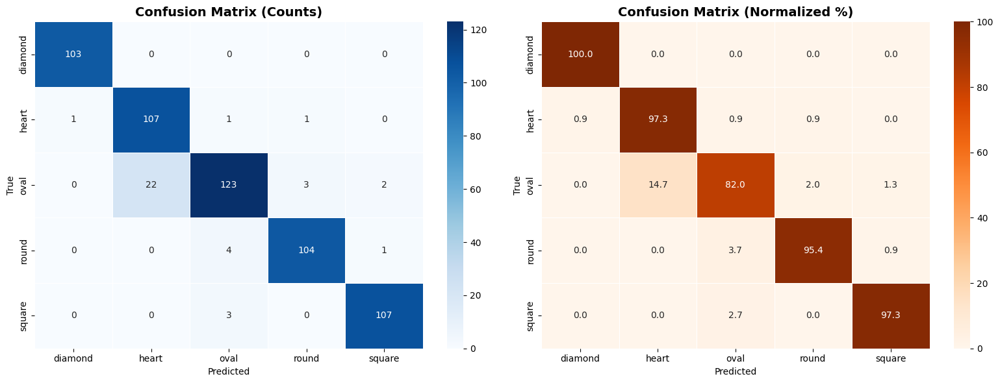

In [24]:
# Confusion Matrix Visualization
cm = sk_confusion_matrix(y_true_all, y_pred_all)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_title('Confusion Matrix (Counts)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')

cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True) * 100
sns.heatmap(cm_norm, annot=True, fmt='.1f', cmap='Oranges',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5)
axes[1].set_title('Confusion Matrix (Normalized %)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')

plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, 'confusion_matrix.png'),
            dpi=150, bbox_inches='tight')
plt.show()

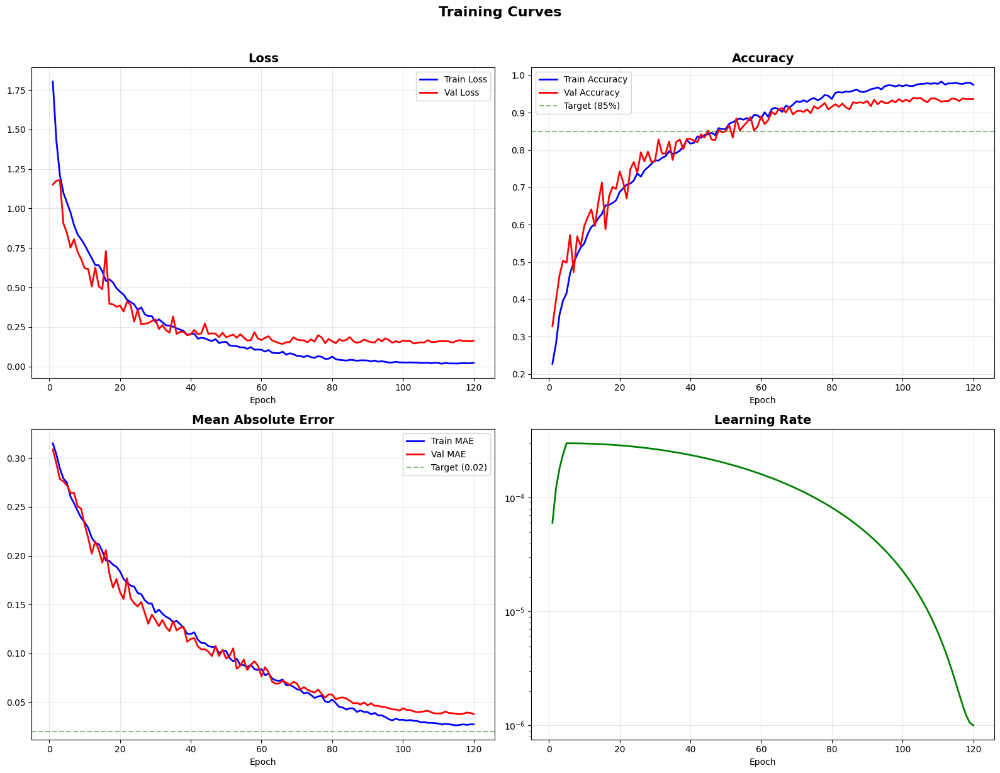

In [25]:
# Training Curves
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
epochs_range = range(1, len(history['train_loss']) + 1)

# Loss
axes[0,0].plot(epochs_range, history['train_loss'], 'b-',
               label='Train Loss', linewidth=2)
axes[0,0].plot(epochs_range, history['val_loss'], 'r-',
               label='Val Loss', linewidth=2)
axes[0,0].set_title('Loss', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Epoch')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

# Accuracy
axes[0,1].plot(epochs_range, history['train_accuracy'], 'b-',
               label='Train Accuracy', linewidth=2)
axes[0,1].plot(epochs_range, history['val_accuracy'], 'r-',
               label='Val Accuracy', linewidth=2)
axes[0,1].axhline(y=0.85, color='g', linestyle='--', alpha=0.5,
                   label='Target (85%)')
axes[0,1].set_title('Accuracy', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Epoch')
axes[0,1].legend()
axes[0,1].grid(True, alpha=0.3)

# MAE
axes[1,0].plot(epochs_range, history['train_mae'], 'b-',
               label='Train MAE', linewidth=2)
axes[1,0].plot(epochs_range, history['val_mae'], 'r-',
               label='Val MAE', linewidth=2)
axes[1,0].axhline(y=0.02, color='g', linestyle='--', alpha=0.5,
                   label='Target (0.02)')
axes[1,0].set_title('Mean Absolute Error', fontsize=14, fontweight='bold')
axes[1,0].set_xlabel('Epoch')
axes[1,0].legend()
axes[1,0].grid(True, alpha=0.3)

# Learning Rate
axes[1,1].plot(epochs_range, history['learning_rate'], 'g-', linewidth=2)
axes[1,1].set_title('Learning Rate', fontsize=14, fontweight='bold')
axes[1,1].set_xlabel('Epoch')
axes[1,1].set_yscale('log')
axes[1,1].grid(True, alpha=0.3)

plt.suptitle('Training Curves', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(MODEL_DIR, 'training_curves.png'),
            dpi=150, bbox_inches='tight')
plt.show()

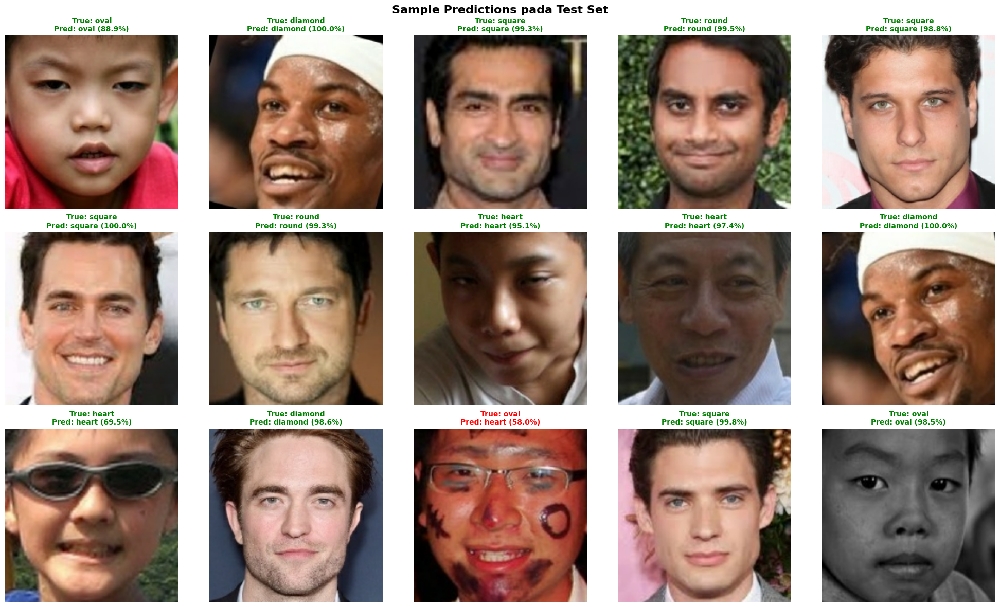

In [26]:
# Sample Predictions Visualization
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
fig.suptitle('Sample Predictions pada Test Set', fontsize=16, fontweight='bold')

for images, labels in test_ds.take(1):
    predictions = model(images, training=False).numpy()
    true_labels = tf.argmax(labels, axis=1).numpy()
    pred_labels = np.argmax(predictions, axis=1)

    for i in range(min(15, len(images))):
        ax = axes[i // 5, i % 5]
        ax.imshow(images[i].numpy().astype('uint8'))
        true_name = CLASS_NAMES[true_labels[i]]
        pred_name = CLASS_NAMES[pred_labels[i]]
        confidence = predictions[i][pred_labels[i]] * 100
        color = 'green' if true_labels[i] == pred_labels[i] else 'red'
        ax.set_title(f'True: {true_name}\nPred: {pred_name} ({confidence:.1f}%)',
                     fontsize=10, color=color, fontweight='bold')
        ax.axis('off')

plt.tight_layout()
plt.show()

---
## Section 8: Model Export

Menyimpan model dalam dua format TensorFlow siap produksi:
1. **`.keras`** - Format Keras native
2. **`SavedModel`** - Format TensorFlow standard untuk deployment

Semua file disimpan ke Google Drive agar persisten.

In [28]:
# ==================== EXPORT MODEL ====================

# 1. Format .keras
keras_path = os.path.join(MODEL_DIR, 'face_shape_model.keras')
model.save(keras_path)
print(f"Model disimpan (Keras)     : {keras_path}")

# 2. Format SavedModel
saved_model_path = os.path.join(MODEL_DIR, 'face_shape_saved_model')
model.export(saved_model_path)
print(f"Model disimpan (SavedModel): {saved_model_path}")

# 3. Simpan class names
class_names_path = os.path.join(MODEL_DIR, 'class_names.json')
with open(class_names_path, 'w', encoding='utf-8') as f:
    json.dump(CLASS_NAMES, f, indent=2)
print(f"Class names disimpan       : {class_names_path}")

# 4. Simpan konfigurasi preprocessing
preprocessing_config = {
    'face_preprocessing_mode': FACE_PREPROCESSING_MODE,
    'original_dataset_dir': ORIGINAL_DATASET_DIR,
    'active_dataset_dir': DATASET_DIR,
    'center_crop_ratio': float(CENTER_CROP_RATIO),
    'classifier_model_from_scratch': True,
    'preprocessing_used_for_classification': False,
}
preprocessing_config_path = os.path.join(MODEL_DIR, 'preprocessing_config.json')
with open(preprocessing_config_path, 'w', encoding='utf-8') as f:
    json.dump(preprocessing_config, f, indent=2)
print(f"Preprocessing config disimpan: {preprocessing_config_path}")

# 5. Simpan training report
report = {
    'class_names': CLASS_NAMES,
    'image_size': IMAGE_SIZE,
    'batch_size': BATCH_SIZE,
    'epochs_trained': len(history['train_loss']),
    'test_loss': float(test_loss),
    'test_accuracy': float(test_acc),
    'test_mae': float(test_mae),
    'best_val_accuracy': float(best_val_acc),
    'best_val_mae': float(best_val_mae),
    'target_accuracy': float(TARGET_ACCURACY),
    'target_mae': float(TARGET_MAE),
    'scratch_training': True,
    'transfer_learning': False,
    'face_preprocessing_mode': FACE_PREPROCESSING_MODE,
    'original_dataset_dir': ORIGINAL_DATASET_DIR,
    'active_dataset_dir': DATASET_DIR,
    'confusion_matrix': cm.tolist(),
    'history': {k: [float(v) for v in vals] for k, vals in history.items()},
}
report_path = os.path.join(MODEL_DIR, 'training_report.json')
with open(report_path, 'w', encoding='utf-8') as f:
    json.dump(report, f, indent=2)
print(f"Training report disimpan    : {report_path}")

# Verifikasi file
print(f"\nIsi folder {MODEL_DIR}:")
for item in sorted(os.listdir(MODEL_DIR)):
    full = os.path.join(MODEL_DIR, item)
    if os.path.isfile(full):
        size_mb = os.path.getsize(full) / (1024 * 1024)
        print(f"   FILE {item:45s} ({size_mb:.2f} MB)")
    else:
        print(f"   DIR  {item}/")

Model disimpan (Keras)     : /content/drive/MyDrive/dataset_after_balancing/models_notebook/face_shape_model.keras
Saved artifact at '/content/drive/MyDrive/dataset_after_balancing/models_notebook/face_shape_saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_image')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  135587015864208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015866512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015859024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015860752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015864592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015867280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015858448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135587015859600: TensorSpec(shape=(), dty

In [29]:
# Verifikasi: Load model kembali dan cek prediksi sama.
loaded_model = tf.keras.models.load_model(
    keras_path,
    custom_objects={
        'SpatialAttentionLayer': SpatialAttentionLayer,
        'TemperatureSoftmax': TemperatureSoftmax,
        'FocalCrossEntropyLoss': FocalCrossEntropyLoss,
    },
    compile=False
)

for test_images_batch, test_labels_batch in test_ds.take(1):
    original_preds = model(test_images_batch[:3], training=False).numpy()
    loaded_preds = loaded_model(test_images_batch[:3], training=False).numpy()
    match = np.allclose(original_preds, loaded_preds, atol=1e-5)
    print(f"Model loaded berhasil. Prediksi cocok: {match}")

Model loaded berhasil. Prediksi cocok: True


---
## Section 9: Inference Code

Kode sederhana untuk menjalankan inferensi pada gambar baru.

In [30]:
def load_image_array_for_inference(image_path):
    """Memuat dan memproses gambar untuk inference."""

    # Melakukan crop gambar dengan preprocessing yang sama seperti saat training.
    # Mode crop mengikuti nilai FACE_PREPROCESSING_MODE.
    cropped = crop_face_region_pil(
        image_path,
        mode=FACE_PREPROCESSING_MODE
    )

    # Mengubah ukuran gambar hasil crop menjadi ukuran input model.
    cropped = cropped.resize(
        (IMAGE_SIZE, IMAGE_SIZE),
        Image.BILINEAR
    )

    img_array = np.asarray(
        cropped,
        dtype=np.float32
    )

    return img_array


def predict_face_shape(image_path, model_path=None, class_names_path=None, top_k=3):
    """Memprediksi bentuk wajah dari satu gambar."""

    # Jika model_path tidak diberikan, gunakan model utama yang sudah disimpan.
    if model_path is None:
        model_path = os.path.join(
            MODEL_DIR,
            'face_shape_model.keras'
        )

    # Jika class_names_path tidak diberikan, gunakan file class_names.json
    # dari folder model.
    if class_names_path is None:
        class_names_path = os.path.join(
            MODEL_DIR,
            'class_names.json'
        )

    # Membaca daftar nama kelas
    with open(class_names_path, 'r') as f:
        class_names = json.load(f)

    # Memuat model yang sudah disimpan.
    inference_model = tf.keras.models.load_model(
        model_path,
        custom_objects={
            'SpatialAttentionLayer': SpatialAttentionLayer,
            'TemperatureSoftmax': TemperatureSoftmax,
            'FocalCrossEntropyLoss': FocalCrossEntropyLoss,
        },

        # compile=False karena model hanya digunakan untuk inference,
        # bukan untuk training ulang.
        compile=False
    )

    # Memuat dan memproses gambar input.
    img_array = load_image_array_for_inference(image_path)

    # Menambahkan dimensi batch.
    img_batch = np.expand_dims(
        img_array,
        axis=0
    )

    # Melakukan prediksi.
    predictions = inference_model(
        img_batch,
        training=False
    ).numpy()[0]

    # Membatasi top_k agar tidak melebihi jumlah kelas.
    top_k = min(
        top_k,
        len(class_names)
    )


    top_indices = predictions.argsort()[-top_k:][::-1]

    # Membuat dictionary berisi top-k prediksi dan confidence-nya.
    all_predictions = {
        class_names[i]: float(predictions[i])
        for i in top_indices
    }

    # Mengembalikan hasil prediksi utama, confidence,
    # dan daftar top-k prediksi.
    return {
        'predicted_class': class_names[top_indices[0]],
        'confidence': float(predictions[top_indices[0]]),
        'all_predictions': all_predictions
    }


# Menampilkan informasi bahwa fungsi inference sudah siap digunakan.
print("Fungsi predict_face_shape() siap digunakan.")

# Contoh pemanggilan fungsi inference.
print("Contoh penggunaan:")
print('   result = predict_face_shape("/content/drive/MyDrive/.../gambar.jpg")')
print('   print(result)')

Fungsi predict_face_shape() siap digunakan.
Contoh penggunaan:
   result = predict_face_shape("/content/drive/MyDrive/.../gambar.jpg")
   print(result)


In [31]:
# Demo inference pada sample dari setiap kelas.
print("Demo Inference:\n")

for cls_name in CLASS_NAMES:
    cls_dir = os.path.join(DATASET_DIR, cls_name)
    sample_candidates = [
        file_name for file_name in os.listdir(cls_dir)
        if file_name.lower().endswith(SUPPORTED_EXTS)
    ]

    if not sample_candidates:
        continue

    sample_image = sorted(sample_candidates)[0]
    sample_path = os.path.join(cls_dir, sample_image)

    result = predict_face_shape(sample_path)

    status = 'CORRECT' if result['predicted_class'] == cls_name else 'WRONG'
    print(f"{status} | True: {cls_name:10s} -> Predicted: {result['predicted_class']:10s} "
          f"(confidence: {result['confidence']*100:.1f}%)")
    for name, prob in result['all_predictions'].items():
        print(f"     {name:10s}: {prob*100:.2f}%")
    print()

Demo Inference:

CORRECT | True: diamond    -> Predicted: diamond    (confidence: 99.8%)
     diamond   : 99.84%
     oval      : 0.08%
     heart     : 0.06%

CORRECT | True: heart      -> Predicted: heart      (confidence: 99.4%)
     heart     : 99.38%
     oval      : 0.61%
     diamond   : 0.00%

WRONG | True: oval       -> Predicted: heart      (confidence: 53.9%)
     heart     : 53.95%
     oval      : 46.05%
     round     : 0.00%

CORRECT | True: round      -> Predicted: round      (confidence: 99.0%)
     round     : 99.01%
     square    : 0.99%
     diamond   : 0.00%

CORRECT | True: square     -> Predicted: square     (confidence: 100.0%)
     square    : 99.98%
     oval      : 0.02%
     heart     : 0.00%

